In [3]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import math
from sklearn.datasets import make_swiss_roll


if torch.cuda.is_available():
    print(torch.cuda.get_device_name(0))  # GPUの名前を表示
else:
    print("CUDA is not available. Using CPU.")

NVIDIA GeForce RTX 3050 6GB Laptop GPU


## 訓練用データ (Swiss roll)

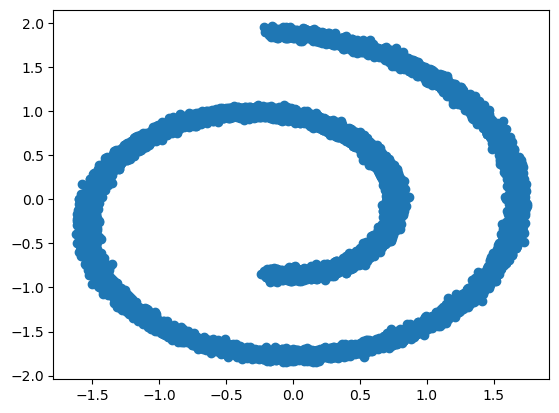

In [81]:
x, _ = make_swiss_roll(n_samples=20000, noise=0.2)
# Make two-dimensional to easen visualization
x = x[:, [0, 2]]

x = (x - x.mean()) / x.std()

plt.scatter(x[:, 0], x[:, 1])

X_data = torch.tensor(x, dtype=torch.float32)

## VE-SDEのノイズスケジュール

- noise schedule: $\sigma(t)= \sigma_\mathrm{min} \left(\frac{\sigma_\mathrm{max}}{\sigma_\mathrm{min}}\right)^t $
- diffusion coefficient: $g(t) = \sigma_\mathrm{min} \left(\frac{\sigma_\mathrm{max}}{\sigma_\mathrm{min}}\right)^t  \sqrt{2 \log\frac{\sigma_\mathrm{max}}{\sigma_\mathrm{min}} }$
- scale schedule: $r(t)= 1 $
- drift coefficient: $f(t)= 0 $

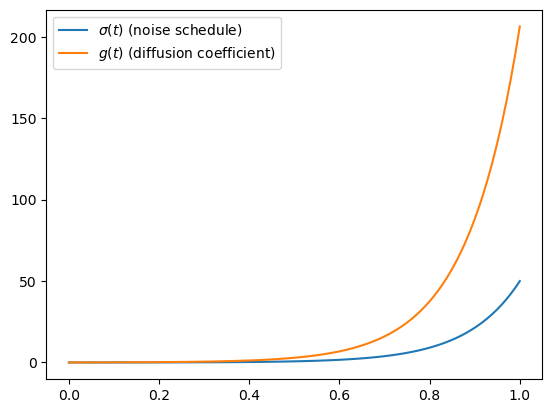

In [82]:
sigma_max = 50
sigma_min = 0.01

def sigma_t(t: torch.Tensor) -> torch.Tensor:
    # t.shape = (batch_size, 1)
    return sigma_min * (sigma_max / sigma_min)**t  # => (batch_size, 1)

def sigma_to_t(sigma: torch.Tensor) -> torch.Tensor:
    # sigma.shape = (batch_size, 1)
    return torch.log(sigma / sigma_min) / torch.log(sigma_max / sigma_min)  # => (batch_size, 1)

def g_t(t: torch.Tensor) -> torch.Tensor:
    """
    dx_t = f_t * x *dt + g_t * dW_t
    t: (batch_size, 1)
    """
    # t.shape = (batch_size, 1)
    return  sigma_min * (sigma_max / sigma_min)**t *math.sqrt(2*math.log(sigma_max / sigma_min))  # => (batch_size, 1)

def f_t(t: torch.Tensor) -> torch.Tensor:
    """
    dx_t = f_t * x *dt + g_t * dW_t
    t: (batch_size, 1)
    """
    # t.shape = (batch_size, 1)
    return 0*torch.ones_like(t)  # => (batch_size, 1)


def r_t(t: torch.Tensor) -> torch.Tensor:
    # t.shape = (batch_size, 1)
    return 1*torch.ones_like(t)  # => (batch_size, 1)

def r_from_sigma(sigma: torch.Tensor) -> torch.Tensor:
    # t.shape = (batch_size, 1)
    return 1*torch.ones_like(sigma)  # => (batch_size, 1)



t  = torch.linspace(0, 1, 100)

plt.plot(t, sigma_t(t), label=r'$\sigma(t)$ (noise schedule)')

plt.plot(t, g_t(t), label=r'$g(t)$ (diffusion coefficient)')

plt.legend()

## NNのクラス，スコア関数のクラスを定義

In [83]:

class NNBlock(nn.Module):
    def __init__(self, nunits):
        super(NNBlock, self).__init__()
        self.linear = nn.Linear(nunits, nunits)
        self.activation = nn.Mish()

    def forward(self, x: torch.Tensor):
        # x.shape = (batch_size, nunits)
        x = self.linear(x)
        x = self.activation(x)  # SiLU
        return x



class NNModel(nn.Module):
    def __init__(self, nfeatures: int, nblocks: int = 2, nunits: int = 32):
        super(NNModel, self).__init__()
        #self.bn = nn.BatchNorm1d(nfeatures+1)
        self.inblock = nn.Linear(nfeatures+1, nunits)
        self.midblocks = nn.ModuleList([NNBlock(nunits) for _ in range(nblocks)])
        self.outblock = nn.Linear(nunits, nfeatures)

    def forward(self, x: torch.Tensor, sigma_t: torch.Tensor) -> torch.Tensor:
        val = torch.hstack([x, sigma_t])  # Add sigma_t to inputs
        #val = self.bn(val)
        val = self.inblock(val)
        for midblock in self.midblocks:
            val = midblock(val)
        val = self.outblock(val)
        return val


class ScoreFunction:
    """
    スコア関数
    """

    def __init__(self, model: NNModel):
        """
        model: スコア関数を学習するモデル

        model(x,t) :=   sigma_t * r_t * score_fn(x_t, sigma_t)
        """
        self.model = model

    def __call__(self, x: torch.Tensor, sigma_t: torch.Tensor) -> torch.Tensor:
        """
        x: 入力データ
        sigma_t: ノイズスケジュール
        """
        # x.shape = (batch_size, nfeatures)
        # t.shape = (batch_size, 1)
        r_t_val = r_from_sigma(sigma_t)  # => (batch_size, 1)
        return self.model(x, sigma_t) / (sigma_t * r_t_val)  # => (batch_size, nfeatures)

    def denoiser(self, x: torch.Tensor, sigma_t: torch.Tensor) -> torch.Tensor:
        return self.model(x, sigma_t)


    def x_hat(self, x_t: torch.Tensor, sigma_t: torch.Tensor) -> torch.Tensor:
        """
        x_tからx_0を推定値の期待値
        x_t: 入力データ
        sigma_t: ノイズスケジュール
        """
        r_t_val = r_from_sigma(sigma_t)
        return x_t / r_t_val + sigma_t * self.model(x_t, sigma_t)


    def train(self):
        """
        学習モードにする
        """
        self.model.train()
    def eval(self):
        """
        評価モードにする
        """
        self.model.eval()





## NNのクラスの初期化

In [84]:
nn_model = NNModel(nfeatures=2, nblocks=4, nunits=32)


device = 'cuda' if torch.cuda.is_available() else 'cpu'
nn_model.to(device)
score_fn = ScoreFunction(nn_model)
print(score_fn.model)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(score_fn.model.parameters(), lr=1e-3)

NNModel(
  (inblock): Linear(in_features=3, out_features=32, bias=True)
  (midblocks): ModuleList(
    (0-3): 4 x NNBlock(
      (linear): Linear(in_features=32, out_features=32, bias=True)
      (activation): Mish()
    )
  )
  (outblock): Linear(in_features=32, out_features=2, bias=True)
)


## スコアの学習
損失関数
$$\mathcal{L}(\theta) = \mathbb{E}_{t\sim U[0,T]} \mathbb{E}_{\boldsymbol{x}_0\sim p_{data}} \mathbb{E}_{\boldsymbol{x}_t\sim p_{\boldsymbol{x}_t \mid \boldsymbol{x}_0}} || r_t \sigma_t \tilde{\boldsymbol{s}}_\theta(\boldsymbol{x}_t,\sigma_t) - r_t \sigma_t \boldsymbol{s}(\boldsymbol{x}\mid x_0) ||^2 $$
$$ = \mathbb{E}_{t\sim U[0,T]} \mathbb{E}_{\boldsymbol{x}_0\sim p_{data}} \mathbb{E}_{\boldsymbol{\epsilon} \sim \mathcal{N}(\boldsymbol{0}, \boldsymbol{I})} || r_t \sigma_t \tilde{\boldsymbol{s}}_\theta(\boldsymbol{x}_0 + \sigma_t \boldsymbol{\epsilon} ,\sigma_t) +\boldsymbol{\epsilon}||^2$$

In [85]:
epochs = 2000
batch_size = 2000
score_fn.train()

score_fn.model.to(device)

for epoch in range(epochs):

    epoch_loss = 0
    step = 0

    for i in range(0, len(X_data)// batch_size):
        Xbatch = X_data[i:i + batch_size]

        t = torch.rand(batch_size, 1)  # 0~1のランダムなtを生成
        sigma_t_batch = sigma_t(t)
        r_t_batch = r_t(t)
        eps = torch.randn_like(Xbatch)  # ノイズを生成
        x_t = r_t_batch * Xbatch + eps * sigma_t_batch * r_t_batch  # ノイズを加える

        sigma_t_batch = sigma_t(t)

        denoiser = score_fn.denoiser(x_t.to(device), sigma_t_batch.to(device))

        loss = loss_fn(denoiser, -eps.to(device))
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        step += 1

    epoch_loss /= step  # 平均損失を計算

    if epoch == 0 or (epoch + 1) % 100 == 0:
        print(f'Epoch [{epoch + 1}/{epochs}], Loss: {epoch_loss:.4f}')


Epoch [1/2000], Loss: 0.9152
Epoch [100/2000], Loss: 0.5288
Epoch [200/2000], Loss: 0.4457
Epoch [300/2000], Loss: 0.4236
Epoch [400/2000], Loss: 0.4222
Epoch [500/2000], Loss: 0.4163
Epoch [600/2000], Loss: 0.4116
Epoch [700/2000], Loss: 0.4278
Epoch [800/2000], Loss: 0.4056
Epoch [900/2000], Loss: 0.4083
Epoch [1000/2000], Loss: 0.4168
Epoch [1100/2000], Loss: 0.4154
Epoch [1200/2000], Loss: 0.4182
Epoch [1300/2000], Loss: 0.4082
Epoch [1400/2000], Loss: 0.4079
Epoch [1500/2000], Loss: 0.4105
Epoch [1600/2000], Loss: 0.4046
Epoch [1700/2000], Loss: 0.4061
Epoch [1800/2000], Loss: 0.4155
Epoch [1900/2000], Loss: 0.3986
Epoch [2000/2000], Loss: 0.4021


## 学習されたスコアの可視化

注意: 
ベクトルの長さは実際にもっと大きなレンジで変わるが可視化のため，$\propto \sigma(t)$でスケーリングしている．

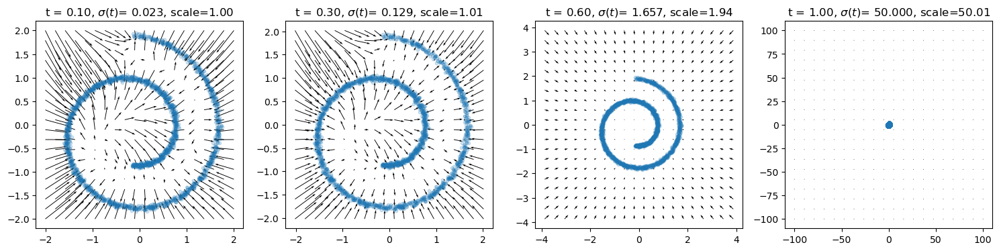

In [96]:
# ---- 学習済みスコアの可視化 (quiver) ----
score_fn.eval()
score_fn.model.to('cpu')

# グリッド作成
x_min, x_max = X_data[:, 0].min().item(), X_data[:, 0].max().item()
y_min, y_max = X_data[:, 1].min().item(), X_data[:, 1].max().item()
pad = 0.5
grid_x = torch.linspace(x_min - pad, x_max + pad, 20)
grid_y = torch.linspace(y_min - pad, y_max + pad, 20)
xx, yy = torch.meshgrid(grid_x, grid_y, indexing='xy')
grid = torch.stack([xx.reshape(-1), yy.reshape(-1)], dim=1)

t_list = [0.1, 0.3, 0.6, 1.0]
fig, axes = plt.subplots(1, 4, figsize=(15, 6))
axes = axes.flatten()

for ax, t_val in zip(axes, t_list):
    sigma = sigma_t(t_val)
    scale = np.sqrt(sigma**2+ 1**2)

    x_min, x_max = -2*scale, 2*scale
    y_min, y_max = -2*scale, 2*scale
    
    grid_x = torch.linspace(x_min, x_max, 20)
    grid_y = torch.linspace(y_min, y_max, 20)
    xx, yy = torch.meshgrid(grid_x, grid_y, indexing='xy')
    grid = torch.stack([xx.reshape(-1), yy.reshape(-1)], dim=1)
    
    t = torch.full((grid.shape[0], 1), t_val)
    sigma_ti = sigma_t(t)
    with torch.no_grad():
        score = score_fn(grid, sigma_ti).cpu().numpy()
    ax.quiver(grid[:, 0].numpy(), grid[:, 1].numpy(), score[:, 0], score[:, 1],
              angles='xy', scale_units='xy', scale=10/sigma**1, width=0.003)
    ax.scatter(X_data[::10, 0], X_data[::10, 1], s=10, alpha=0.2)
    ax.set_title(f"t = {t_val:.2f}," +r" $\sigma(t)$"+ f"= {sigma:.3f}, scale={scale:.2f}")
    ax.set_aspect('equal', adjustable='box')
plt.tight_layout()


## 逆拡散過程によるサンプリング

オイラー・丸山法

$$ \boldsymbol{x}_{t-\Delta t} = \boldsymbol{x}_t - \left[  -f(t)\boldsymbol{x}_t - g(t)^2 \tilde{\boldsymbol{s}}_{\theta^*}(\boldsymbol{x}_t,\sigma_t)  \right]\Delta t+ g(t)\sqrt{\Delta t} \boldsymbol{z} $$

$$\boldsymbol{z}\sim \mathcal{N}(\boldsymbol{0},\boldsymbol{I})$$

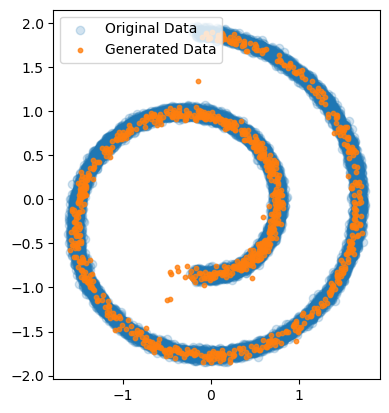

In [92]:
def reverse_SDE_sampling(score_fn: ScoreFunction, n_samples: int = 100,n_steps: int = 100):
    """
    スコア関数を用いてサンプリングする
    """
    # 初期化
    x_t = torch.randn(n_samples, 2) * sigma_max  # 初期状態は大きなノイズ
    timesteps = torch.linspace(1, 0, n_steps+1)  # タイムステップを生成

    x_trace = []

    score_fn.model.to('cpu')

    with torch.no_grad():
        score_fn.eval()
        for i in range(n_steps ):

            t = timesteps[i]

            # t を [nsample,1 ] にする。
            t = t.unsqueeze(0).repeat(n_samples, 1)

            dt = abs(timesteps[i] - timesteps[i + 1] )

            sigma_ti = sigma_t(t)

            x_t = x_t + x_t*f_t(t) * -dt - g_t(t)**2 * score_fn(x_t, sigma_ti) * -dt + g_t(t) * torch.randn_like(x_t) * math.sqrt(dt)

            x_trace.append(x_t.detach().numpy())

        x_0 = x_trace[-1]  # 最後のステップの結果を取得

    return x_0, x_trace



x_0, x_trace = reverse_SDE_sampling(score_fn, n_samples=1000, n_steps=30)

plt.scatter(X_data[:, 0::10], X_data[:, 1::10], alpha=0.2, label='Original Data')
plt.scatter(x_0[:, 0], x_0[:, 1], alpha=0.8,s=10, label='Generated Data')

plt.gca().set_aspect('equal', adjustable='box')
plt.legend()

In [93]:

!pip -q install plotly

import numpy as np
import plotly.graph_objects as go

def visualize_trace_plotly(x_trace):
    arr = np.stack(x_trace, axis=0)  # (T, N, 2)
    T = arr.shape[0]

    fig = go.Figure(
        data=[go.Scatter(x=arr[0,:,0], y=arr[0,:,1], mode='markers')],
        layout=go.Layout(
            xaxis=dict(scaleanchor='y', scaleratio=1),  # 正方比
            title=f"t-step: 0 / {T-1}",
            updatemenus=[dict(
                type="buttons",
                buttons=[
                    dict(label="Play", method="animate",
                         args=[None, {"frame": {"duration": 60, "redraw": True},
                                      "fromcurrent": True, "transition": {"duration": 0}}]),
                    dict(label="Pause", method="animate",
                         args=[[None], {"frame": {"duration": 0, "redraw": False},
                                        "mode": "immediate",
                                        "transition": {"duration": 0}}]),
                ]
            )]
        ),
        frames=[
            go.Frame(
                data=[go.Scatter(x=arr[k,:,0], y=arr[k,:,1], mode='markers')],
                name=str(k),
                layout=go.Layout(title=f"t-step: {k} / {T-1}")
            ) for k in range(T)
        ]
    )

    # スライダー
    fig.update_layout(
        sliders=[{
            "steps": [
                {"method": "animate", "args": [[str(k)],
                 {"mode": "immediate", "frame": {"duration": 0, "redraw": True},
                  "transition": {"duration": 0}}], "label": str(k)}
                for k in range(T)
            ],
            "active": 0
        }]
    )

    fig.show()

# ---- 使い方例 ----
# x_0, x_trace = sampling(score_fn, n_samples=100, n_steps=100)
# visualize_trace_plotly(x_trace)

In [94]:
visualize_trace_plotly(x_trace)


# 観測ガイダンス付き拡散モデル

$$ \boldsymbol{x}_{t-\Delta t} = \boldsymbol{x}_t - \left[  -f(t)\boldsymbol{x}_t - g(t)^2 (\tilde{\boldsymbol{s}}_{\theta^*}(\boldsymbol{x}_t, t)  + \nabla_{\boldsymbol{x}_t} \log{p(y\mid \boldsymbol{x}_t)}) \right]\Delta t+ g(t)\sqrt{\Delta t} \boldsymbol{z} $$

$$\boldsymbol{z}\sim \mathcal{N}(\boldsymbol{0},\boldsymbol{I})$$

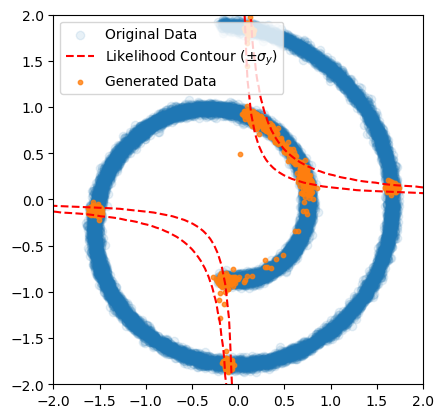

In [ ]:

def likelihood_guidance(score_fn: ScoreFunction, x_t, sigma_t):

    y_input = 0.2
    y = y_input*torch.ones((x_t.shape[0],1), dtype=torch.float32)  # 目標値を設定
    sigma_y = 0.05  # yのノイズレベルは0.02

    def forward(x_0):
        return (x_0[:,0]*x_0[:,1]).unsqueeze(1)  # yの形状に合わせるためにunsqueezeする

    x_t = x_t.detach().requires_grad_(True)
    x_hat = score_fn.x_hat(x_t, sigma_t)  # x_0の期待値
    resid = y - forward(x_hat)            #残渣
    S = (sigma_y**2 + sigma_t**2)         # guidance factor
    loglikelihood = -0.5 * (resid**2).sum(dim=1) / S.squeeze()   # (N,)

    # ベクトル出力なので，合計にしてスカラー化してから勾配を取る
    x_grad = torch.autograd.grad(
        outputs=loglikelihood.sum(),    # スカラー
        inputs=x_t,
        retain_graph=False,             # ループ内なのでできるだけFalse
        create_graph=False,             # 2階微分が不要ならFalse
    )[0]

    return loglikelihood.detach(), x_grad.detach()


def bayesian_reverse_SDE_sampling(score_fn: ScoreFunction, n_samples: int = 100,n_steps: int = 100):
    """
    スコア関数を用いてサンプリングする
    """
    # 初期化
    x_t = torch.randn(n_samples, 2) * sigma_max  # 初期状態は大きなノイズ
    timesteps = torch.linspace(1, 0, n_steps+1)  # タイムステップを生成

    x_trace = []


    for i in range(n_steps ):

        t = timesteps[i]

        # t を [nsample,1 ] にする。
        t = t.unsqueeze(0).repeat(n_samples, 1)
        dt = abs(timesteps[i] - timesteps[i + 1] )
        sigma_ti = sigma_t(t)
        _, x_grad = likelihood_guidance(score_fn, x_t, sigma_ti)

        # 逆向きSDE
        x_t = x_t + x_t*f_t(t) * -dt - g_t(t)**2 * (score_fn(x_t, sigma_ti)+1*x_grad )   * -dt + g_t(t) * torch.randn_like(x_t) * math.sqrt(dt)

        x_trace.append(x_t.detach().numpy())

    x_0 = x_trace[-1]  # 最後のステップの結果を取得

    return x_0, x_trace

x_0, x_trace = bayesian_reverse_SDE_sampling(score_fn, n_samples=1000, n_steps=100)

plt.scatter(X_data[:, 0], X_data[:, 1], alpha=0.1, label='Original Data')

x_ = torch.linspace(-2,2,100)
X_,Y_ = torch.meshgrid(x_, x_)
X = torch.stack([X_.flatten(),Y_.flatten()],dim=1)

Likelihood,_ = likelihood_guidance(score_fn, X, sigma_t=torch.zeros(X.shape[0], 1) )

plt.contour(X_,Y_,-Likelihood.reshape(100,100), levels=[1], colors='red', linestyles='dashed')

plt.plot([np.nan], [np.nan], 'r--', label=r'Likelihood Contour ($\pm \sigma_y$)')
plt.scatter(x_0[:, 0], x_0[:, 1], alpha=0.8,s=10, label='Generated Data')

plt.legend()
plt.gca().set_aspect('equal', adjustable='box')

In [59]:
visualize_trace_plotly(x_trace)